In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
import json
import cv2

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import train

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

Using TensorFlow backend.


In [2]:
ROOT_DIR

'C:\\Users\\jason\\PycharmProjects'

In [3]:
config = train.CustomConfig()
CUSTOM_DIR = "./dataset"

In [4]:
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                17
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [5]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [6]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [7]:
annotations = json.load(open('./dataset/test/via_region_data.json'))

In [8]:
annotations

{'IMG_6069.JPG1709125': {'filename': 'IMG_6069.JPG',
  'size': 1709125,
  'regions': [{'shape_attributes': {'name': 'polygon',
     'all_points_x': [1359,
      1096,
      887,
      669,
      669,
      732,
      874,
      1117,
      1401,
      1744,
      2058,
      2267,
      2422,
      2409,
      2338,
      1907,
      1439,
      1058],
     'all_points_y': [1497,
      1535,
      1614,
      1715,
      1886,
      2062,
      2208,
      2259,
      2305,
      2280,
      2192,
      2058,
      1815,
      1581,
      1451,
      1435,
      1435,
      1539]},
    'region_attributes': {'name': 'mask',
     'type': 'mask',
     'image_quality': {'good': True,
      'frontal': True,
      'good_illumination': True}}},
   {'shape_attributes': {'name': 'polygon',
     'all_points_x': [736,
      548,
      418,
      230,
      151,
      155,
      213,
      276,
      443,
      598,
      640,
      627,
      514,
      414,
      310,
      163,
      109,
     

In [9]:
b = json.load(open('./dataset/train/via_region_data.json'))
b

{'IMG_0.JPG381527': {'filename': 'IMG_0.JPG',
  'size': 381527,
  'regions': [{'shape_attributes': {'name': 'polygon',
     'all_points_x': [470,
      468,
      400,
      362,
      426,
      470,
      528,
      538,
      613,
      599,
      605,
      623,
      579,
      484],
     'all_points_y': [354,
      400,
      587,
      737,
      914,
      999,
      1015,
      942,
      924,
      653,
      514,
      352,
      348,
      342]},
    'region_attributes': {'name': 'mask',
     'type': 'mask',
     'image_quality': {'good': True,
      'frontal': True,
      'good_illumination': True}}},
   {'shape_attributes': {'name': 'polygon',
     'all_points_x': [532,
      597,
      631,
      641,
      631,
      643,
      627,
      617,
      601,
      607,
      627,
      621,
      595,
      575,
      565,
      555,
      540],
     'all_points_y': [334,
      193,
      106,
      131,
      167,
      183,
      301,
      340,
      348,
      293,
    

In [10]:
info = dataset.image_info[0]
list(map(lambda x: x if x < info['height'] else info['height']-1, info['polygons'][0]['all_points_x']))

NameError: name 'dataset' is not defined

In [10]:
dataset = train.CustomDataset()
dataset.load_custom(CUSTOM_DIR, "test")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

objects: ['mask', 'ear_band', 'ear_band', 'full_mask']
numids [1, 3, 3, 4]
objects: ['ear_band', 'ear_band', 'mask', 'full_mask']
numids [3, 3, 1, 4]
objects: ['mask', 'ear_band', 'ear_band', 'full_mask']
numids [1, 3, 3, 4]
objects: ['mask', 'ear_band', 'ear_band', 'full_mask']
numids [1, 3, 3, 4]
objects: ['mask', 'nose_wire', 'ear_band', 'ear_band', 'full_mask']
numids [1, 2, 3, 3, 4]
objects: ['mask', 'nose_wire', 'ear_band', 'ear_band', 'full_mask']
numids [1, 2, 3, 3, 4]
objects: ['mask', 'ear_band', 'nose_wire', 'ear_band', 'full_mask']
numids [1, 3, 2, 3, 4]
objects: ['mask', 'nose_wire', 'ear_band', 'ear_band', 'full_mask']
numids [1, 2, 3, 3, 4]
objects: ['mask', 'ear_band', 'ear_band', 'full_mask']
numids [1, 3, 3, 4]
objects: ['mask', 'ear_band', 'ear_band', 'full_mask']
numids [1, 3, 3, 4]
objects: ['mask', 'ear_band', 'ear_band', 'nose_wire', 'full_mask']
numids [1, 3, 3, 2, 4]
objects: ['mask', 'nose_wire', 'ear_band', 'ear_band', 'full_mask']
numids [1, 2, 3, 3, 4]
obje

In [11]:
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode='inference', model_dir=MODEL_DIR, config=config)








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [12]:
weights_path = 'C:/Users/jason/logs/object20210603T1612/mask_rcnn_object_0005.h5'

print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True, exclude=[ "mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_mask"])

Loading weights  C:/Users/jason/logs/object20210603T1612/mask_rcnn_object_0005.h5






Re-starting from epoch 5


hello!!!!!
image ID: object.IMG_6107.JPG (38) ./dataset\test\IMG_6107.JPG
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.30000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (4,)                  min:    2.00000  max:    4.00000  int32
gt_bbox                  shape: (4, 4)                min:   71.00000  max:  921.00000  int32
gt_mask                  shape: (1024, 1024, 4)       min:    0.00000  max:    1.00000  bool
1
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    1.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -122.70000  max:  151.10000  float64
image_metas              shape: (

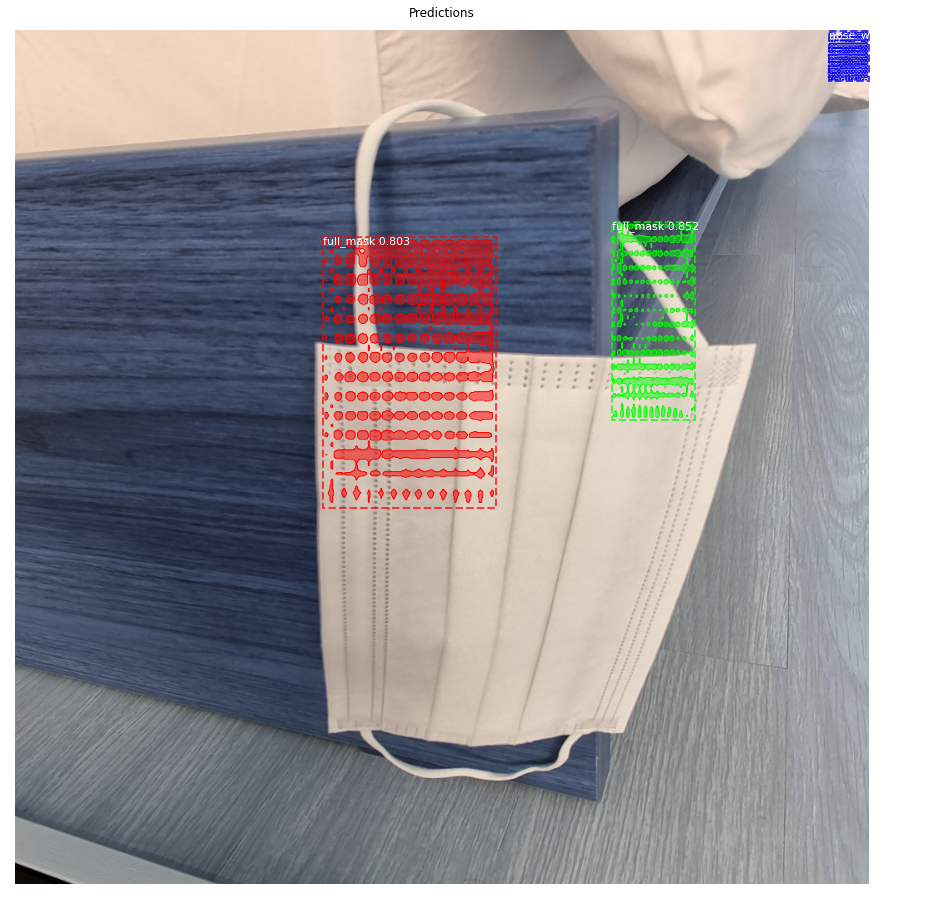

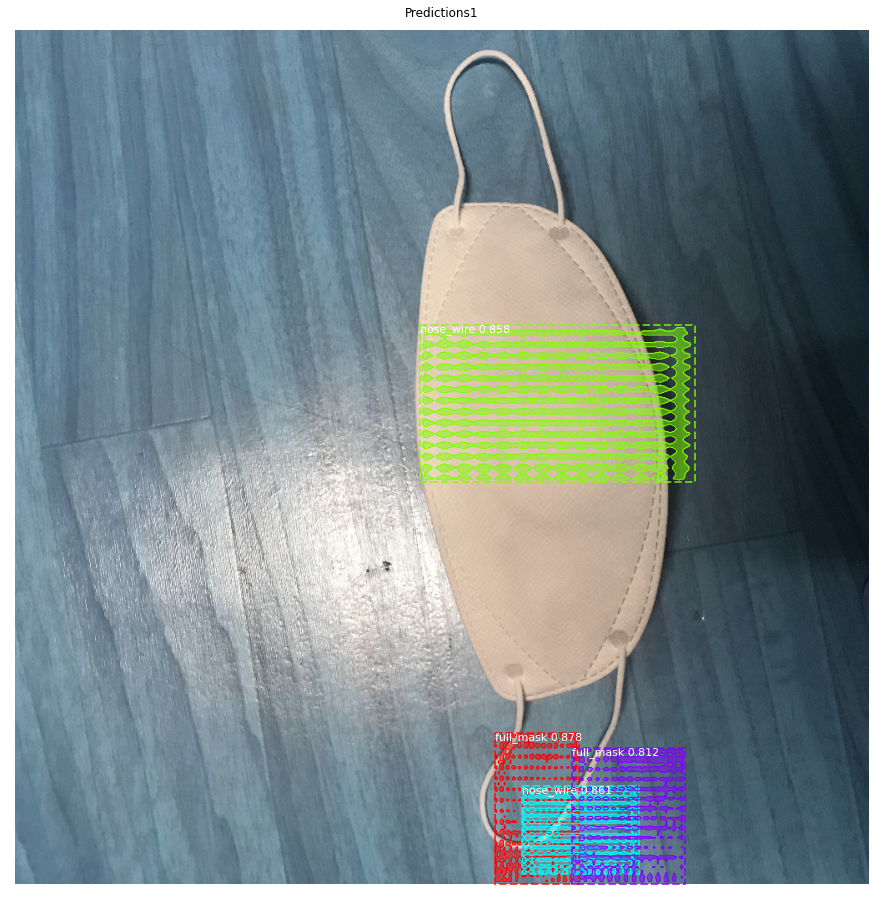

In [13]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)


# This is for predicting images which are not present in dataset
#image_id = random.choice(dataset.image_ids)
image1 = mpimg.imread('./dataset/test/IMG_6069.jpg')
image1 = cv2.resize(image1, dsize=(1024, 1024), interpolation=cv2.INTER_LINEAR)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

    # Run object detection
print(len([image1]))
results1 = model.detect([image1], verbose=1)

    # Display results
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
                            dataset.class_names, r1['scores'], ax=ax,
                            title="Predictions1")

(1024, 1024, 3)


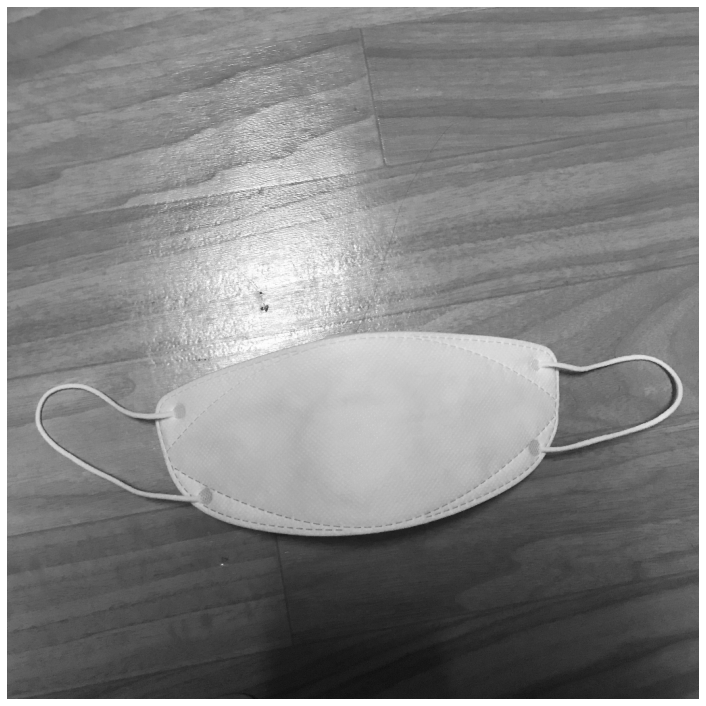

In [15]:
print(image.shape)
splash = train.color_splash(image, r['masks'])
display_images([splash], cols=1)

In [16]:
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral_anchors", neutral_anchors)


refined_anchors = utils.apply_box_deltas(
    positive_anchors, target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -2.44466  max:    1.84373  float64
positive_anchors         shape: (10, 4)               min:   21.96133  max: 1024.00000  float64
negative_anchors         shape: (246, 4)              min:  -64.00000  max: 1040.00000  float64
neutral_anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (10, 4)               min:   19.99997  max: 1015.00012  float32


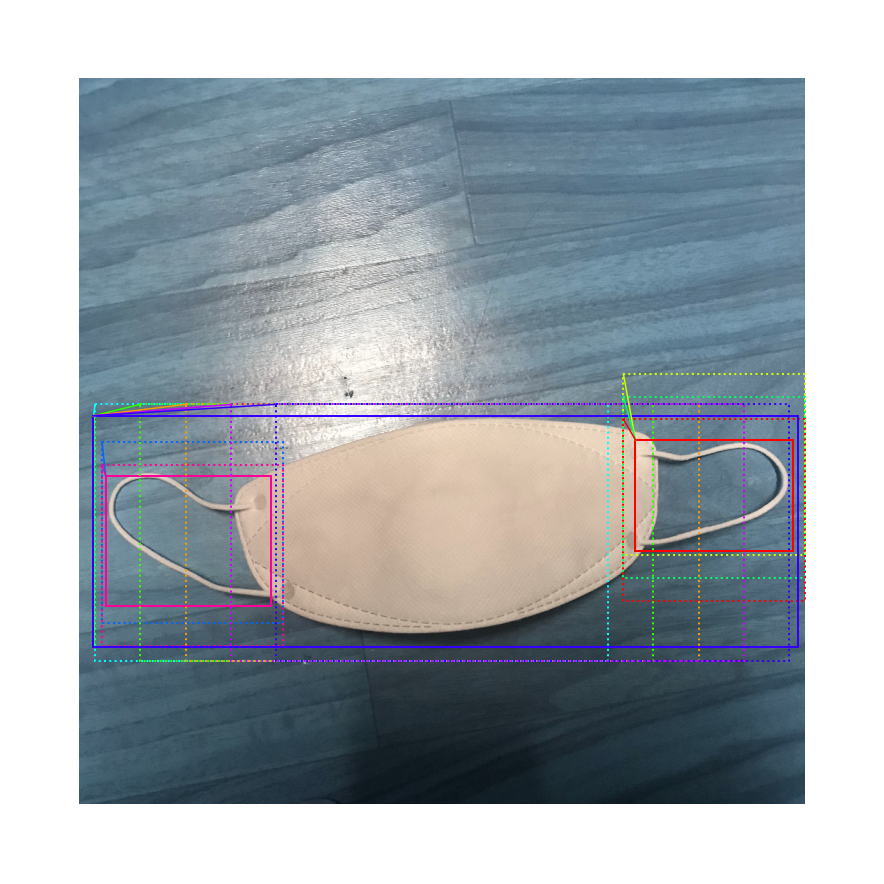

In [17]:
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

In [18]:
pillar = model.keras_model.get_layer("ROI").output

nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
    
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.35390  max:    1.29134  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.44365  max:    1.43809  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 3755.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


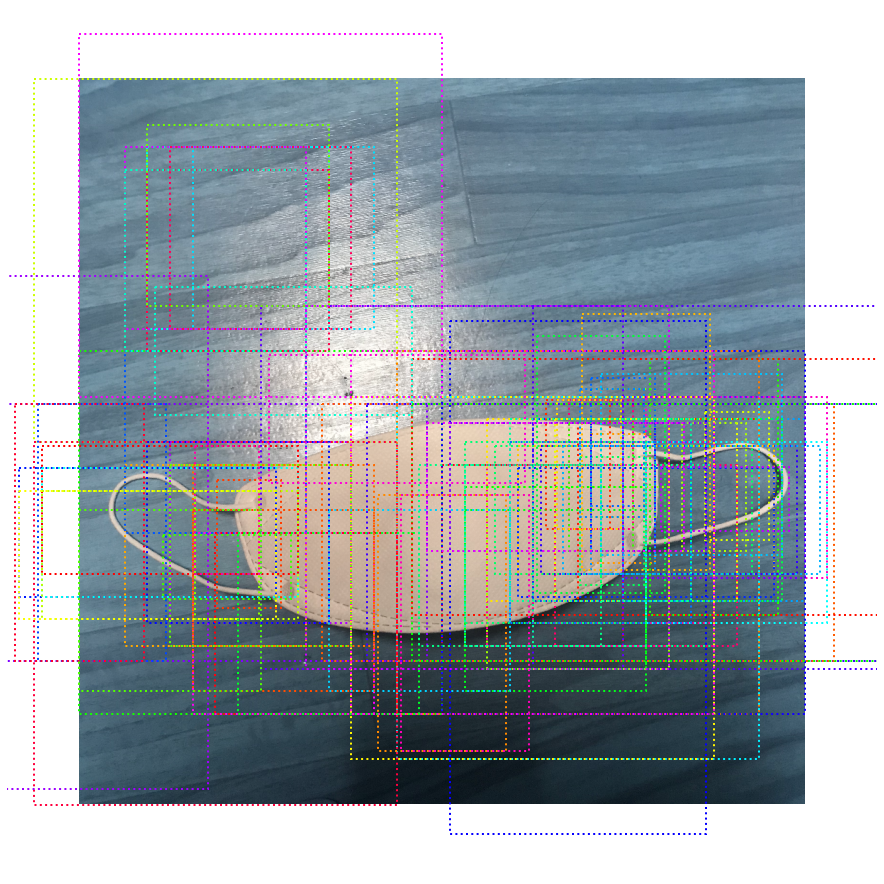

In [19]:
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

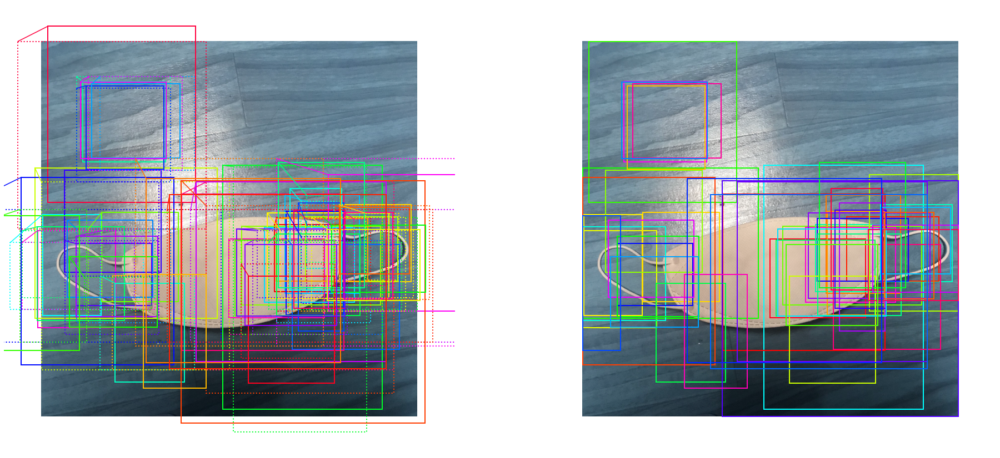

In [20]:
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                    refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

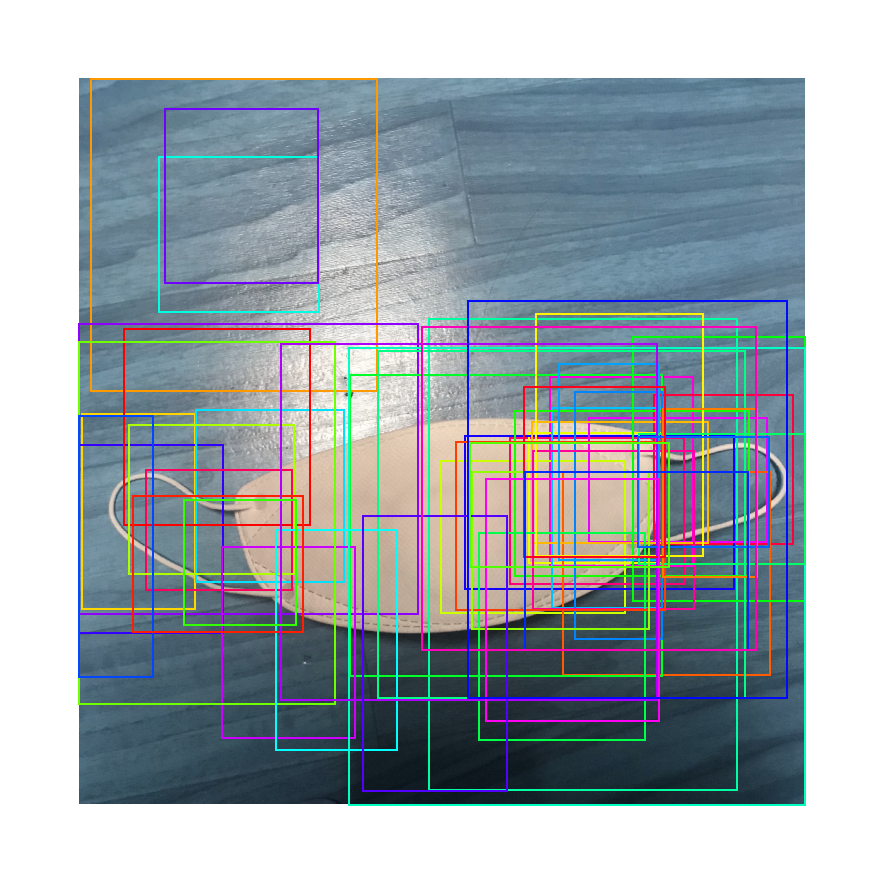

In [21]:
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

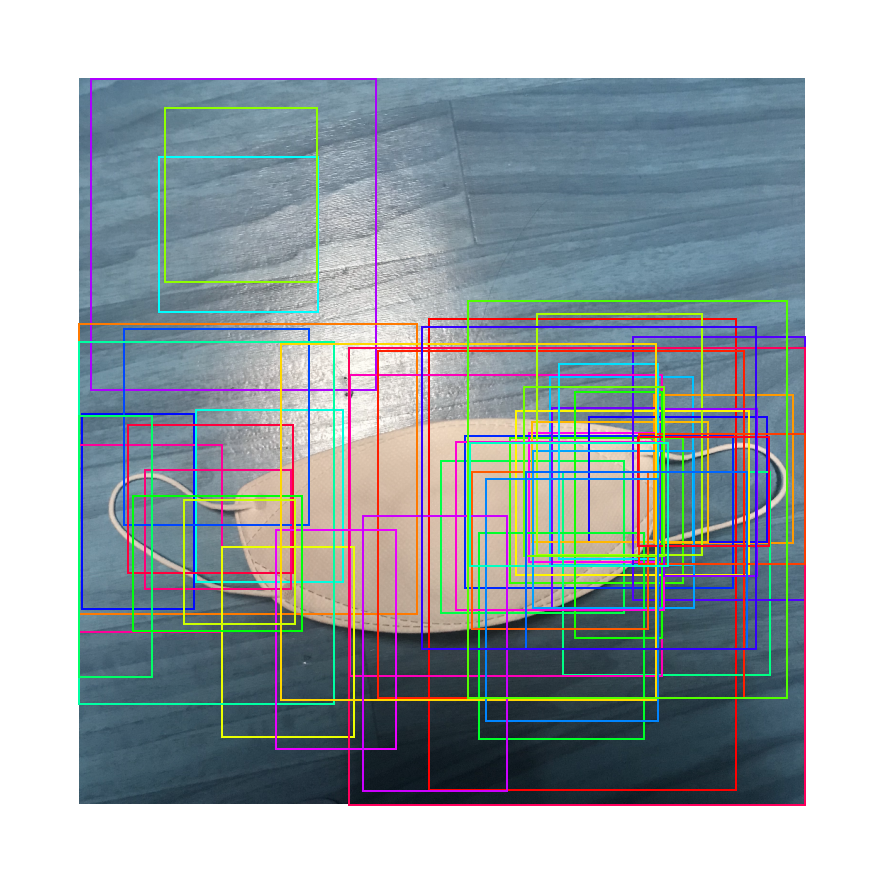

In [22]:
limit = 50
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn["proposals"][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [23]:
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 5)          min:    0.00095  max:    0.89799  float32
deltas                   shape: (1, 1000, 5, 4)       min:   -4.39445  max:    4.28250  float32
masks                    shape: (1, 100, 28, 28, 5)   min:    0.30787  max:    0.72566  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    0.00000  float32


In [27]:
mrcnn['masks']

array([[[[[0.50199276, 0.6057441 , 0.43945146, 0.48753363, 0.5055474 ],
          [0.4489646 , 0.50265175, 0.4644119 , 0.4264554 , 0.42595434],
          [0.51724744, 0.66939914, 0.41942796, 0.49442723, 0.55805683],
          ...,
          [0.48978072, 0.50302887, 0.45236707, 0.41837993, 0.39459655],
          [0.5001542 , 0.5685704 , 0.44809076, 0.4782859 , 0.5286667 ],
          [0.46963173, 0.5131255 , 0.5032713 , 0.45459533, 0.43414864]],

         [[0.469705  , 0.49054348, 0.42193022, 0.47984025, 0.49681774],
          [0.4891027 , 0.5219085 , 0.4949535 , 0.4906567 , 0.46578452],
          [0.46631145, 0.47532713, 0.39974958, 0.48189154, 0.47707954],
          ...,
          [0.48841724, 0.5202463 , 0.39628986, 0.4357214 , 0.4618982 ],
          [0.52244705, 0.47996017, 0.40484825, 0.484923  , 0.46491644],
          [0.47985032, 0.5120622 , 0.4009472 , 0.45676932, 0.46669173]],

         [[0.49134302, 0.6297791 , 0.40448833, 0.42658392, 0.56346256],
          [0.45606598, 0.51938

0 detections : []


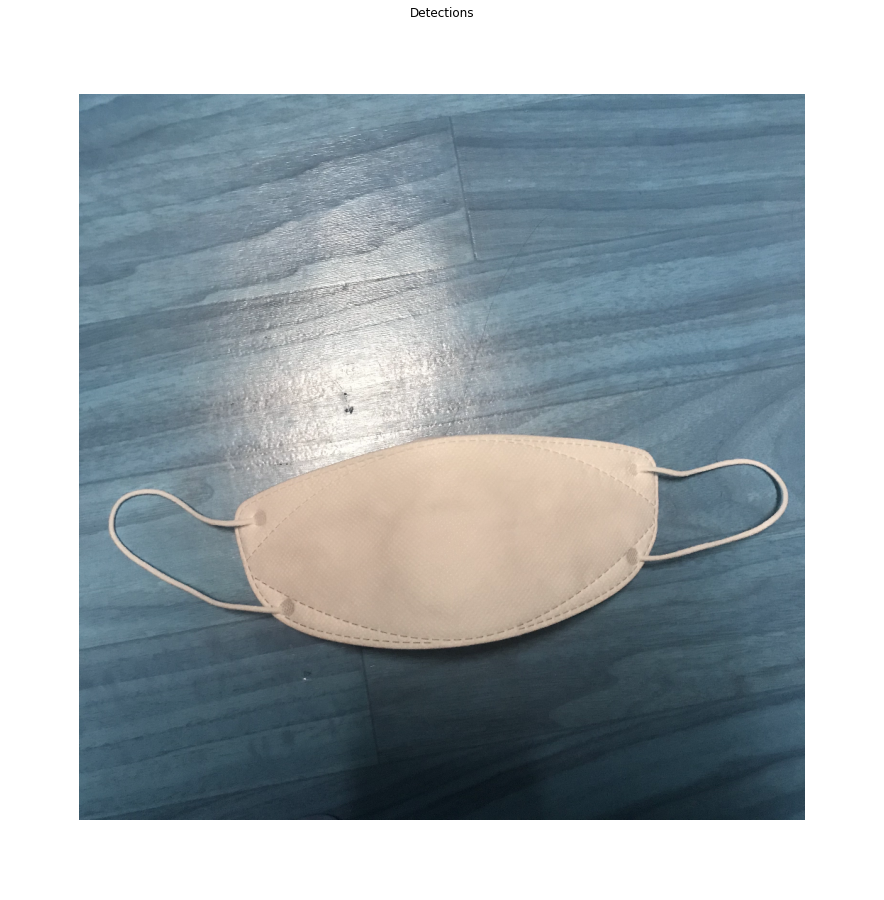

In [25]:
det_class_ids = mrcnn['detections'][0, : ,4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections : {}".format(det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else "" for c, s in zip(detections[:, 4], detections[:, 5])]

visualize.draw_boxes(
    image,
    refined_boxes = utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2]*len(detections),
    captions = captions, title="Detections", ax=get_ax())

In [25]:
w

1024

In [28]:
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h,w,h,w])).astype(np.int32)


roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
904 Positive ROIs
[('BG', 96), ('ear_band', 326), ('full_mask', 1), ('mask', 150), ('nose_wire', 427)]


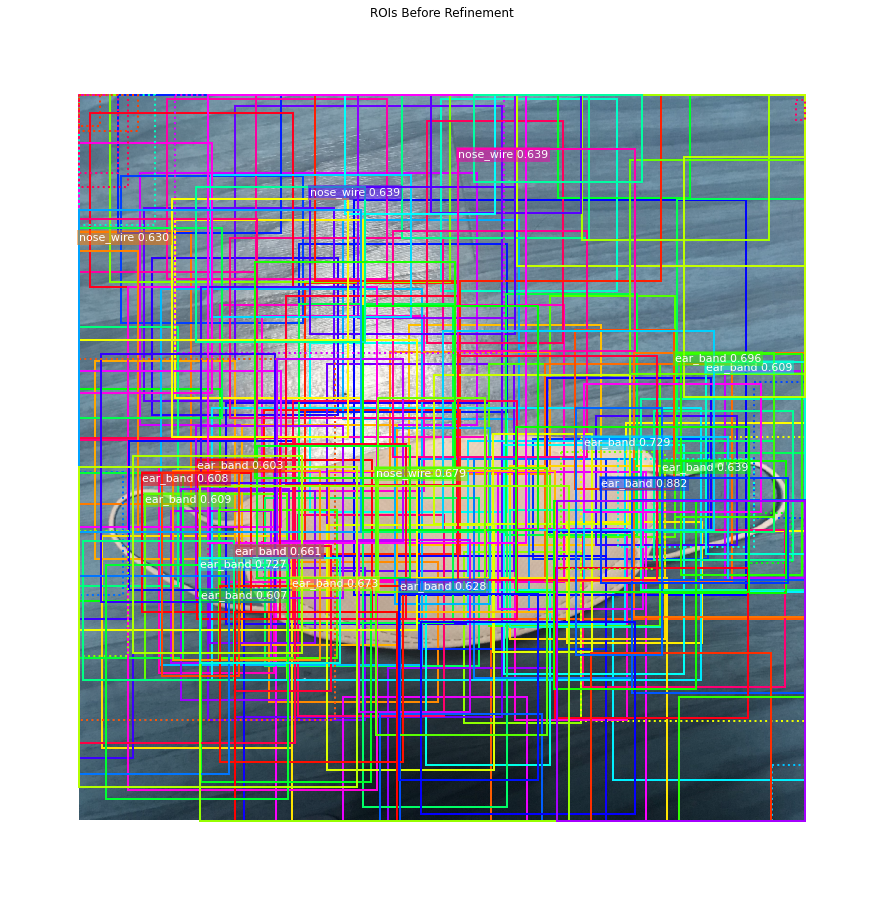

In [29]:
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 and s > 0.6 else "" for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]

visualize.draw_boxes(image, boxes=proposals[ixs],
                    visibilities = np.where(roi_class_ids[ixs] > 0, 2, 1),
                    captions=captions, title="ROIs Before Refinement",
                    ax=get_ax())

roi_bbox_specific        shape: (1000, 4)             min:   -2.59875  max:    3.07287  float32
refined_proposals        shape: (1000, 4)             min: -107.00000  max: 1206.00000  int32


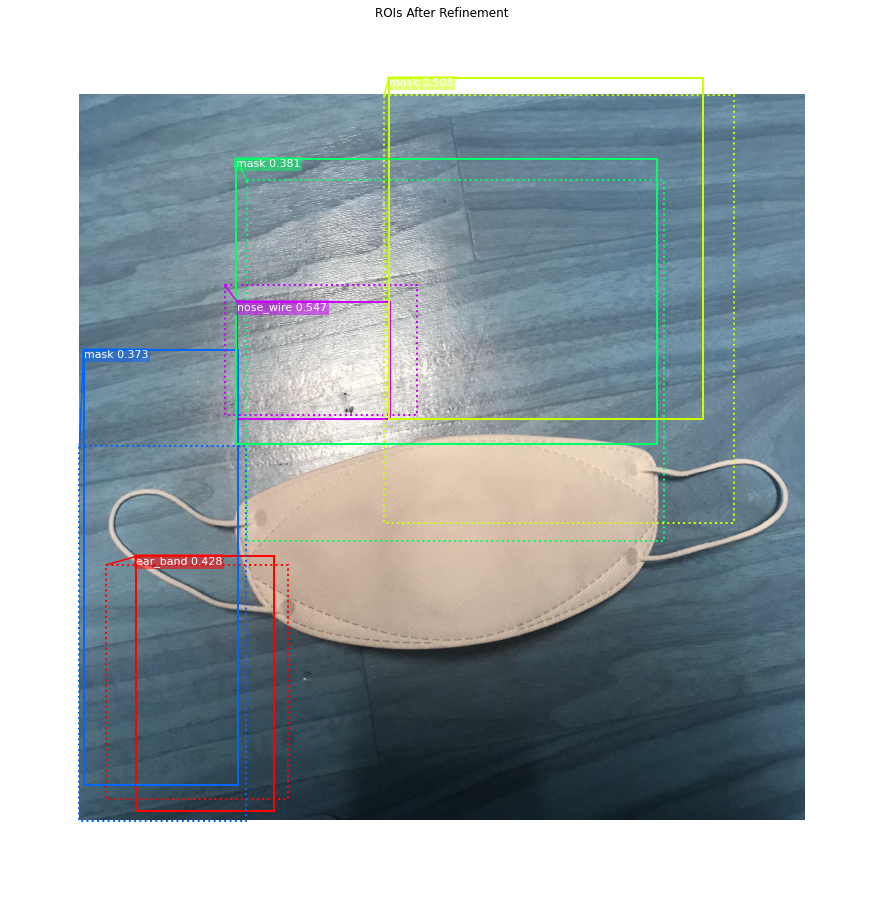

In [30]:
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)


limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else "" 
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]

visualize.draw_boxes(image, boxes = proposals[roi_positive_ixs][ids],
                     refined_boxes = refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax = get_ax())




In [31]:
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections: \n{}".format(keep.shape[0], keep))

Keep 904 detections: 
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  90  91
  92  93  94  95  96  97  98  99 100 101 102 104 105 106 107 108 109 110
 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128
 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146
 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164
 165 166 167 168 169 170 171 172 173 174 175 177 179 180 181 183 184 186
 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205
 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223
 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241
 242 243 244 245 246 247 248 

In [32]:
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
class_keep_lst = []
for class_id in np.unique(pre_nms_class_ids):
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs],
                                          pre_nms_scores[ixs],
                                          config.DETECTION_NMS_THRESHOLD)
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20],
                                  keep[ixs], class_keep))
    class_keep_lst.append(class_keep)
    
keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

mask                  : [  5   8  21  23  32  33  38  49  54  70  72  75  93 107 108 109 126 127
 133 136 140 151 162 163 168 169 172 173 174 188 191 197 203 210 211 213
 217 220 228 234 254 256 260 263 290 293 302 304 309 310 312 315 317 320
 322 328 332 348 354 361 363 368 381 382 398 399 417 427 430 431 436 443
 459 469 472 489 494 496 497 508 511 512 515 520 522 531 543 548 549 565
 572 573 584 604 610 634 641 648 654 659 663 664 668 675 677 679 693 694
 702 713 714 730 731 734 736 745 756 757 762 767 776 786 790 802 803 804
 810 811 833 835 840 841 849 859 860 861 879 892 896 899 901 917 926 932
 937 948 969 970 985 999] -> [756 520 332 730 859 548  72 427 664 260 290 917 151 926 220 572 169 322
 668]
nose_wire             : [  1   4  10  12  14  18  22  26  30  31  34  41  42  45  46  52  53  56
  58  59  64  65  66  68  71  73  74  76  77  79  80  82  84  85  86  87
  92  96  97  98 101 102 104 106 111 115 117 121 123 124 125 128 130 131
 132 143 145 147 150 152 155 159 160 161 

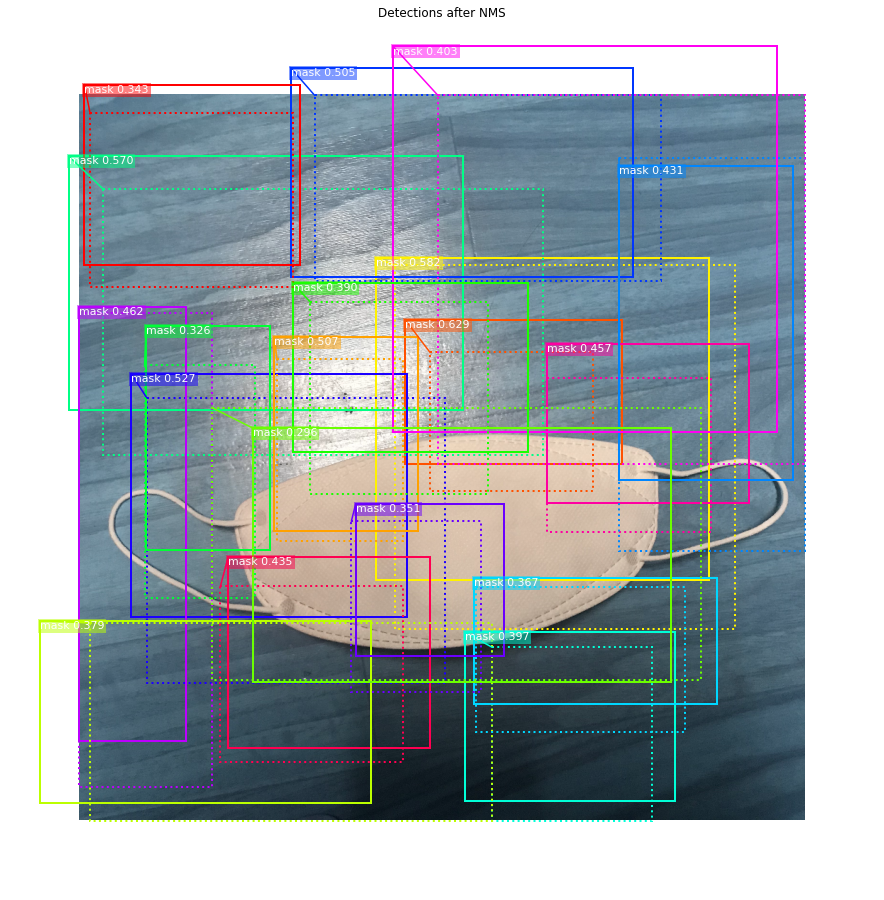

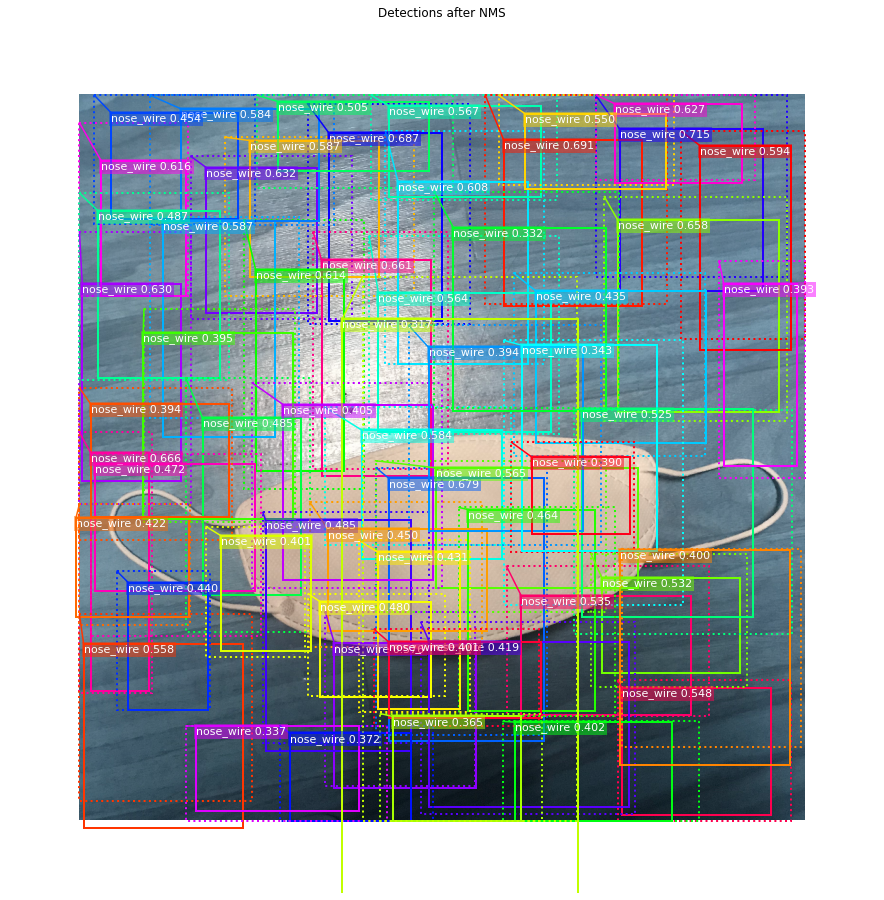

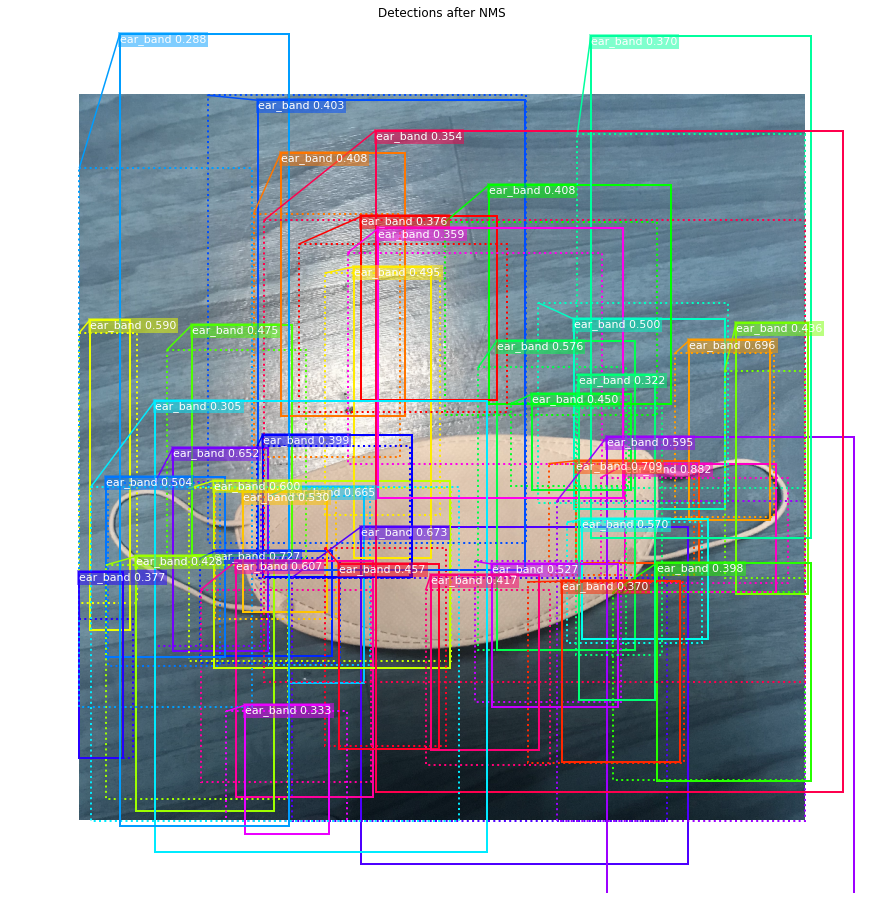

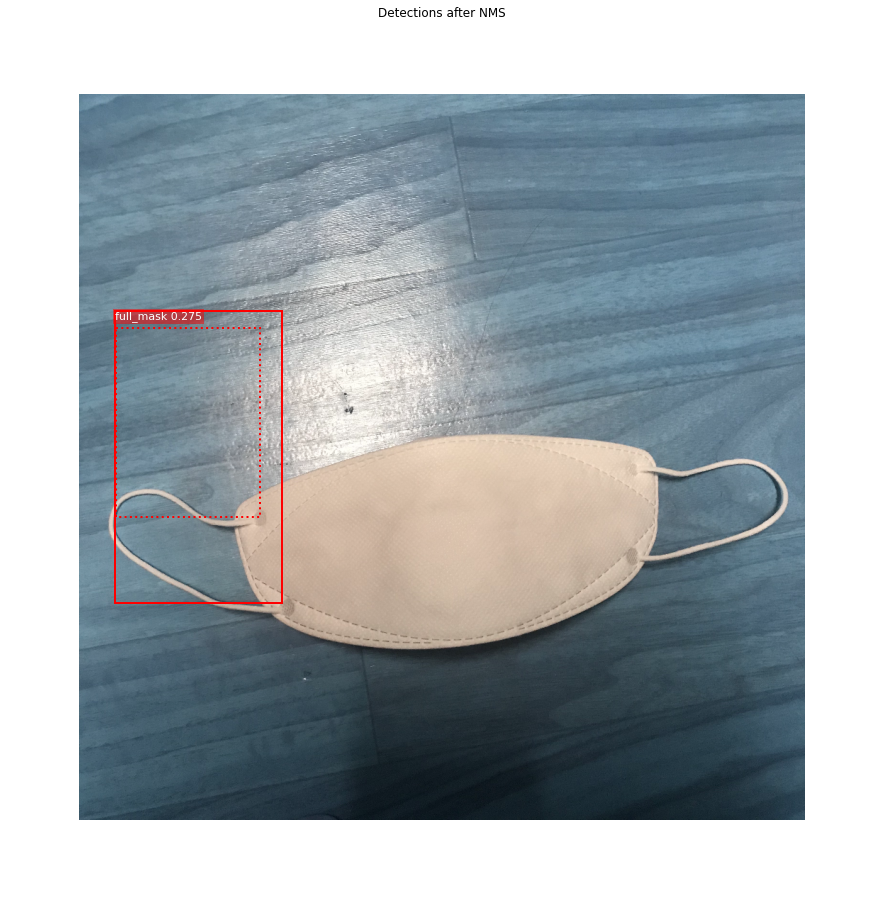

In [33]:
for keep in class_keep_lst:
    ixs = np.arange(len(keep))

    captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
               for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]

    visualize.draw_boxes(image, boxes=proposals[keep][ixs],
                         refined_boxes=refined_proposals[keep][ixs],
                         visibilities=np.where(roi_class_ids[keep][ixs]> 0, 1, 0),
                         captions=captions, title="Detections after NMS",
                         ax=get_ax())


In [ ]:
dataset_dir = './dataset'

annotations = json.load(open('./dataset/train/via_region_data.json'))
annotations = list(annotations.values())
annotations = [a for a in annotations if a['regions']]

In [ ]:
a = annotations[0]

polygons = [r['shape_attributes'] for r in a['regions']]

In [ ]:
info = dataset.image_info[1]
num_ids = info['num_ids']
mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)


In [ ]:
p = info['polygons']
p

In [ ]:
mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                dtype=np.uint8)

for i, e in enumerate(info["polygons"]):
    # Get indexes of pixels inside the polygon and set them to 1
    if e['name'] == 'rect':
        rr, cc = skimage.draw.rectangle((e['y'], e['x']), (e['height'], e['width']))
        mask[rr, cc, i] = 1
    elif e['name'] == 'ellipse':
        rr, cc = skimage.draw.ellipse(e['cy'], e['cx'], e['ry'], e['rx'], rotation=e['theta'])
        mask[rr, cc, i] = 01
    elif e['name'] == 'polygon':
        rr, cc = skimage.draw.polygon(e['all_points_y'], e['all_points_x'])
        mask[rr, cc, i] = 1

In [ ]:
import skimage

In [ ]:
info['polygons']

In [ ]:
"""import skimage

info = dataset.image_info[image_id]
num_ids = info['num_ids']
mask = np.zeros([info["height"], info["width"], len(info["polygons"]),3],
                dtype=np.uint8)
for i, e in enumerate(info["polygons"]):
    # Get indexes of pixels inside the polygon and set them to 1
    if e['name'] == 'rect':
        rr, cc = skimage.draw.rectangle(start=(e['y'], e['x']), extent=(e['height'], e['width']))
    elif e['name'] == 'ellipse':
        rr, cc = skimage.draw.ellipse(e['cy'], e['cx'], e['ry'], e['rx'], rotation=-e['theta'])
    elif e['name'] == 'polygon':
        rr, cc = skimage.draw.polygon(e['all_points_y'], e['all_points_x'])
    mask[rr, cc, i] = [0, 255, 0]
info['polygons']

img1 = cv2.imread(info['path'])
dst = cv2.resize(img1, dsize=(1024,1024), interpolation=cv2.INTER_LINEAR)

dst2 = cv2.resize(mask[rr, cc, 2], dsize=(1024,1024), interpolation=cv2.INTER_LINEAR)

dst3 = cv2.addWeighted(dst, 0.8, dst2, 0.2, 0)

cv2.imshow("src",dst3)
cv2.waitKey()
cv2.destroyAllWindows()"""